**This projects consists in image-to-image translation.**

**My aim was to have an input of a photo of a person (as you may see later, I limited the model to young men for better results) and generate an image of this same person with cat eyes.**

**I used the CelebA dataset (https://www.kaggle.com/datasets/jessicali9530/celeba-dataset) and the Cat Dataset (https://www.kaggle.com/datasets/crawford/cat-dataset), although as you may read, the use of the latter one was abandoned as I created my own dataset.**

# **Importing the libraries**

In [22]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import os
from tqdm import tqdm
from PIL import Image as Image
from PIL import ImageOps

# **Data Exploration and Information**

In [23]:
df = pd.read_csv('/kaggle/input/celeba-dataset/list_attr_celeba.csv')
print('shape of our data', df.shape)

shape of our data (202599, 41)


In [24]:
# Let's have a look at what our data looks like
print(df.head())

     image_id  5_o_Clock_Shadow  Arched_Eyebrows  Attractive  Bags_Under_Eyes  \
0  000001.jpg                -1                1           1               -1   
1  000002.jpg                -1               -1          -1                1   
2  000003.jpg                -1               -1          -1               -1   
3  000004.jpg                -1               -1           1               -1   
4  000005.jpg                -1                1           1               -1   

   Bald  Bangs  Big_Lips  Big_Nose  Black_Hair  ...  Sideburns  Smiling  \
0    -1     -1        -1        -1          -1  ...         -1        1   
1    -1     -1        -1         1          -1  ...         -1        1   
2    -1     -1         1        -1          -1  ...         -1       -1   
3    -1     -1        -1        -1          -1  ...         -1       -1   
4    -1     -1         1        -1          -1  ...         -1       -1   

   Straight_Hair  Wavy_Hair  Wearing_Earrings  Wearing_Hat  We

In [4]:
# and the data information
print(df.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 202599 entries, 0 to 202598
Data columns (total 41 columns):
 #   Column               Non-Null Count   Dtype 
---  ------               --------------   ----- 
 0   image_id             202599 non-null  object
 1   5_o_Clock_Shadow     202599 non-null  int64 
 2   Arched_Eyebrows      202599 non-null  int64 
 3   Attractive           202599 non-null  int64 
 4   Bags_Under_Eyes      202599 non-null  int64 
 5   Bald                 202599 non-null  int64 
 6   Bangs                202599 non-null  int64 
 7   Big_Lips             202599 non-null  int64 
 8   Big_Nose             202599 non-null  int64 
 9   Black_Hair           202599 non-null  int64 
 10  Blond_Hair           202599 non-null  int64 
 11  Blurry               202599 non-null  int64 
 12  Brown_Hair           202599 non-null  int64 
 13  Bushy_Eyebrows       202599 non-null  int64 
 14  Chubby               202599 non-null  int64 
 15  Double_Chin          202599 non-nu

In [5]:
# and also the data description
df.describe()

,5_o_Clock_Shadow,Arched_Eyebrows,Attractive,Bags_Under_Eyes,Bald,Bangs,Big_Lips,Big_Nose,Black_Hair,Blond_Hair,...,Sideburns,Smiling,Straight_Hair,Wavy_Hair,Wearing_Earrings,Wearing_Hat,Wearing_Lipstick,Wearing_Necklace,Wearing_Necktie,Young
count,202599.000000,202599.000000,202599.00000,202599.000000,202599.000000,202599.000000,202599.000000,202599.000000,202599.000000,202599.000000,...,202599.000000,202599.000000,202599.000000,202599.000000,202599.00000,202599.000000,202599.000000,202599.000000,202599.000000,202599.000000
mean,-0.777728,-0.466039,0.02501,-0.590857,-0.955113,-0.696849,-0.518408,-0.530935,-0.521498,-0.704016,...,-0.886979,-0.035839,-0.583196,-0.360866,-0.62215,-0.903079,-0.055129,-0.754066,-0.854570,0.547234
std,0.628602,0.884766,0.99969,0.806778,0.296241,0.717219,0.855135,0.847414,0.853255,0.710186,...,0.461811,0.999360,0.812333,0.932620,0.78290,0.429475,0.998482,0.656800,0.519338,0.836982
min,-1.000000,-1.000000,-1.00000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,...,-1.000000,-1.000000,-1.000000,-1.000000,-1.00000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000
25%,-1.000000,-1.000000,-1.00000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,...,-1.000000,-1.000000,-1.000000,-1.000000,-1.00000,-1.000000,-1.000000,-1.000000,-1.000000,1.000000
50%,-1.000000,-1.000000,1.00000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,...,-1.000000,-1.000000,-1.000000,-1.000000,-1.00000,-1.000000,-1.000000,-1.000000,-1.000000,1.000000
75%,-1.000000,1.000000,1.00000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,...,-1.000000,1.000000,-1.000000,1.000000,-1.00000,-1.000000,1.000000,-1.000000,-1.000000,1.000000
max,1.000000,1.000000,1.00000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,...,1.000000,1.000000,1.000000,1.000000,1.00000,1.000000,1.000000,1.000000,1.000000,1.000000


**Interpretation**
- There are 202599 rows, each having 41 columns 
- 54,7% of our dataset (202599 faces) is made of young people
- Among these columns, 'young' and 'male' will be the ones selected in order to simplify the process, let's visualize this data


# **Data visualisation**

In [25]:
# let's only look at our selected features
selected_features = ['image_id','Male', 'Young']
filtered_df = df[selected_features]
# let's check if there are any missing values
filtered_df.isna().sum()

image_id    0
Male        0
Young       0
dtype: int64

In [7]:
# let's check if everything is alright
print(filtered_df.head())

     image_id  Male  Young
0  000001.jpg    -1      1
1  000002.jpg    -1      1
2  000003.jpg     1      1
3  000004.jpg    -1      1
4  000005.jpg    -1      1


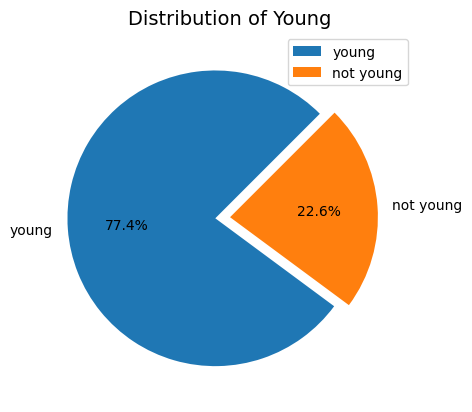

In [8]:
# now we can have a look at the distribution of young
filtered_df['Young'].value_counts().plot.pie(explode=[0.1,0],autopct='%3.1f%%',labels=['young', 'not young'],legend=True,startangle=45)
plt.ylabel('')
plt.title('Distribution of Young',size=14)
plt.show()

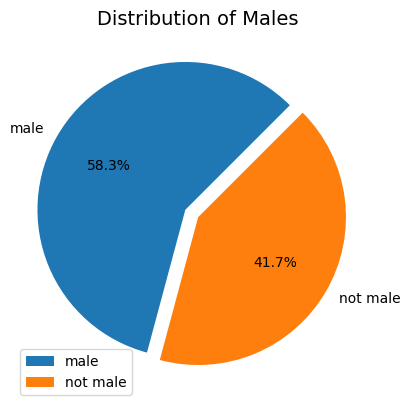

In [9]:
# let's do the same for males
filtered_df['Male'].value_counts().plot.pie(explode=[0.1,0],autopct='%3.1f%%',labels=['male','not male'],legend=True,startangle=45)
plt.ylabel('')
plt.title('Distribution of Males',size=14)
plt.show()

**Interpretation**
- Our data seems good, we have many males
- We also have many young people
- Now let's visualize how male and young intertwine

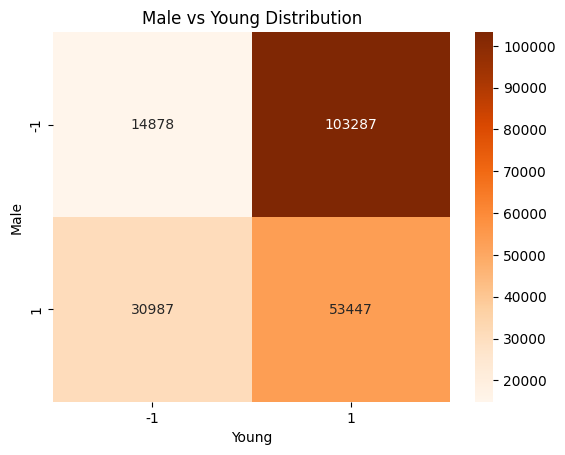

In [10]:
# heatmap for the crosstab visualization
crosstab = pd.crosstab(filtered_df["Male"], filtered_df["Young"])
sns.heatmap(crosstab, annot=True, fmt="d",cmap='Oranges')
plt.title("Male vs Young Distribution")
plt.xlabel("Young")
plt.ylabel("Male")
plt.show()


**Interpretation**
- We have 53447 young males, it is enough
- Therefore we can select only the young males as our data

In [26]:
young_male_df = filtered_df[(filtered_df['Young'] == 1) & (filtered_df['Male'] == 1)]
# let's check if everything is alright
print(young_male_df.head())

      image_id  Male  Young
2   000003.jpg     1      1
6   000007.jpg     1      1
7   000008.jpg     1      1
11  000012.jpg     1      1
12  000013.jpg     1      1


# **Data Preprocessing**

In [27]:
PIC_DIR = f'../input/celeba-dataset/img_align_celeba/img_align_celeba/'

IMAGES_COUNT = 1000  # Number of images to process

ORIG_WIDTH = 178
ORIG_HEIGHT = 208
diff = (ORIG_HEIGHT - ORIG_WIDTH) // 2

WIDTH = 128
HEIGHT = 128

crop_rect = (0, diff, ORIG_WIDTH, ORIG_HEIGHT - diff)

young_male_df_limited = young_male_df.head(IMAGES_COUNT)

images = []
for pic_file in tqdm(young_male_df_limited['image_id'], desc="Processing Images", total=IMAGES_COUNT):
    img_path = os.path.join(PIC_DIR, pic_file)  # Use 'image_id' as the filename
    try:
        pic = Image.open(img_path).crop(crop_rect)  # Load and crop the image
        pic.thumbnail((WIDTH, HEIGHT), Image.Resampling.LANCZOS)  # Resize the image
        images.append(np.array(pic, dtype=np.uint8))  # Add to the list
    except Exception as e:
        print(f"Error processing {pic_file}: {e}")
        
# now 'images' contains all the processed images
np.save('male_images.npy', images)

Processing Images: 100%|██████████| 1000/1000 [00:02<00:00, 406.22it/s]


In [13]:
# image shape
images = np.array(images) / 255
print(images.shape)

(1000, 128, 128, 3)


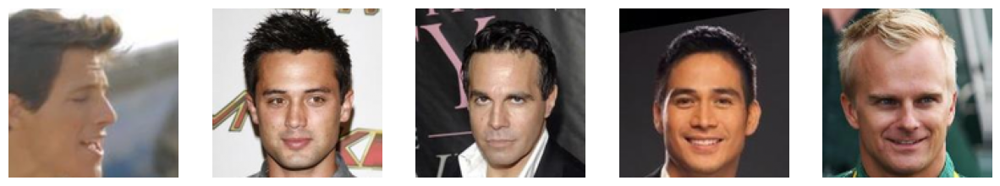

In [14]:
# display first 5 images
plt.figure(1, figsize=(15, 5))
for i in range(5):
    plt.subplot(1, 5, i+1)  
    plt.imshow(images[i])  
    plt.axis('off') 

plt.show()


Here I'll combine the former dataset that has been modified with a dataset of cats.

My idea was to use a dataset of cats containing coordinates for their eyes, and ChatGPT helped me write a code that also returned the coordinates of the eyes of the dataset of young males. 

In [15]:
# install MTCNN
!pip install mtcnn

/opt/conda/lib/python3.10/pty.py:89: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  pid, fd = os.forkpty()


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.9/1.9 MB 28.0 MB/s eta 0:00:00a 0:00:01


In [28]:
# this cell was made with the help of ChatGPT, the prompt being close to: "I have a dataset of human faces, how to make it so I can get their eyes coordinates ?"

# initialization of the MTCNN detector
from mtcnn import MTCNN
from tqdm import tqdm
import numpy as np

detector = MTCNN()
eye_coordinates = []  # list to store eye coordinates

with tqdm(range(IMAGES_COUNT), desc="Processing Eyes Coordinates") as pbar:
    for i in pbar:
        try:
            # get the preprocessed image from 'images'
            img_array = images[i]

            # detection of the face with the detector
            faces = detector.detect_faces(img_array)

            # extract eye coordinates
            for face in faces:
                left_eye = face['keypoints']['left_eye']
                right_eye = face['keypoints']['right_eye']
                eye_coordinates.append((left_eye, right_eye))

        except Exception as e:
            tqdm.write(f"Error processing image {i}: {e}")  

# save the eye coordinates
np.save('eye_coordinates.npy', eye_coordinates)


Processing Eyes Coordinates: 100%|██████████| 1000/1000 [01:31<00:00, 10.94it/s]


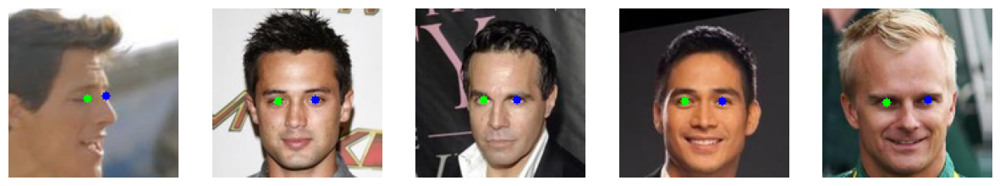

In [29]:
# now that we have the coordinates of the eyes, let's check if it's accurate with the first 5 images
import cv2

# load the saved eye coordinates
eye_coordinates = np.load('eye_coordinates.npy', allow_pickle=True)


for i in range(5): 
    img_array = images[i]
    img_bgr = cv2.cvtColor(img_array, cv2.COLOR_RGB2BGR)  # convert to BGR for drawing

    # get the corresponding eye coordinates
    left_eye, right_eye = eye_coordinates[i]

    # draw circles for the eyes
    cv2.circle(img_bgr, tuple(map(int, left_eye)), radius=3, color=(0, 255, 0), thickness=-1)  # Green for left eye
    cv2.circle(img_bgr, tuple(map(int, right_eye)), radius=3, color=(255, 0, 0), thickness=-1)  # Blue for right eye

    # convert back to RGB for matplotlib
    img_rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)

    # plot the image
    plt.figure(1, figsize=(15, 5))
    plt.subplot(1, 5, i + 1) 
    plt.imshow(img_rgb)
    plt.axis('off')

plt.show()




In [30]:
CAT_DIR = '../input/cat-dataset/CAT_00/'  # Path to cat dataset

# load annotation files
cat_annotation_files = sorted([f for f in os.listdir(CAT_DIR) if f.endswith('.cat')])

# function to load the eye coordinates from the cat annotation file
def load_cat_eye_coordinates(annotation_file):
    annotation_path = os.path.join(CAT_DIR, annotation_file)
    try:
        with open(annotation_path, 'r') as f:
            coords = list(map(int, f.readline().strip().split()))
        left_eye = (coords[1], coords[2])  # Left eye (x, y)
        right_eye = (coords[3], coords[4])  # Right eye (x, y)
        return left_eye, right_eye
    except Exception as e:
        print(f"Error reading {annotation_file}: {e}")
        return None, None

# function to preprocess images
def preprocess_image(img_path, target_size=(128, 128)):
    try:
        img = Image.open(img_path)
        
        # fit image to target size (resize and pad)
        img = ImageOps.fit(img, target_size, Image.Resampling.LANCZOS)
        return np.array(img, dtype=np.uint8)
    except Exception as e:
        print(f"Error processing image {img_path}: {e}")
        return None

# function to scale coordinates
def scale_coordinates(coords, original_size, target_size=(128, 128)):
    original_width, original_height = original_size
    target_width, target_height = target_size
    scale_x = target_width / original_width
    scale_y = target_height / original_height
    
    scaled_coords = (int(coords[0] * scale_x), int(coords[1] * scale_y))
    return scaled_coords

# preprocess cat images
cat_images = []
cat_eye_coordinates = []

for annotation_file in tqdm(cat_annotation_files, desc="Processing Cat Images"):
    left_eye, right_eye = load_cat_eye_coordinates(annotation_file)
    if left_eye is None or right_eye is None:
        continue  # skip invalid annotations

    # get the original size of the image
    cat_img_path = os.path.join(CAT_DIR, annotation_file.replace('.cat', ''))
    try:
        with Image.open(cat_img_path) as img:
            original_size = img.size
    except Exception as e:
        print(f"Error loading image size for {cat_img_path}: {e}")
        continue

    # scale the eye coordinates to match the resized 128x128 image
    left_eye_scaled = scale_coordinates(left_eye, original_size)
    right_eye_scaled = scale_coordinates(right_eye, original_size)

    # preprocess the cat image
    preprocessed_image = preprocess_image(cat_img_path)
    if preprocessed_image is not None:
        cat_images.append(preprocessed_image)  
        cat_eye_coordinates.append((left_eye_scaled, right_eye_scaled))


# save preprocessed cat images and eye coordinates
np.save('cat_images.npy', cat_images)
np.save('cat_eye_coordinates.npy', cat_eye_coordinates)

Processing Cat Images: 100%|██████████| 1706/1706 [00:52<00:00, 32.64it/s]


In [ ]:
# let's check if everything is going good
plt.figure(1, figsize=(10, 10))
for i in range(5):
    plt.subplot(1, 5, i+1)  
    plt.imshow(cat_images[i])  
    plt.axis('off') 

plt.show()

# **Manual way of generating cat eyes**

Creating New Images: 100%|██████████| 1000/1000 [00:00<00:00, 6580.59it/s]


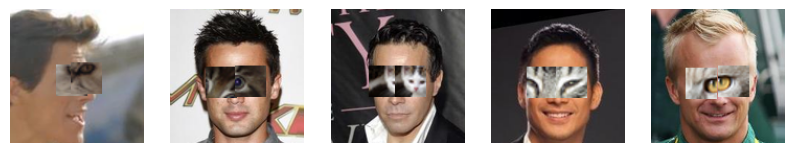

In [31]:
# this cell was made with the help of ChatGPT, the prompt being close to: "I have images of humans and cats, as well as their eyes coordinates, how to make it so the humans get the cat eyes ?"

# load preprocessed data
cat_images = np.load('cat_images.npy') 
cat_eye_coordinates = np.load('cat_eye_coordinates.npy', allow_pickle=True) 
male_images = np.load('male_images.npy') 
male_eye_coordinates = np.load('eye_coordinates.npy', allow_pickle=True) 

# function to extract eye region
def extract_eye_region(image, eye_center, region_size=(20, 20)):
    x, y = eye_center
    half_width, half_height = region_size[0] // 2, region_size[1] // 2
    return image[y - half_height:y + half_height, x - half_width:x + half_width]

# function to replace eyes
def replace_eye_region(target_image, eye_region, eye_center):
    x, y = eye_center
    h, w = eye_region.shape[:2]

    # calculate bounds for the region in the target image
    y1, y2 = max(0, y - h // 2), min(target_image.shape[0], y + h // 2)
    x1, x2 = max(0, x - w // 2), min(target_image.shape[1], x + w // 2)

    # calculate bounds for the region in the eye_region
    ey1, ey2 = max(0, h // 2 - y), min(h, target_image.shape[0] - (y - h // 2))
    ex1, ex2 = max(0, w // 2 - x), min(w, target_image.shape[1] - (x - w // 2))

    # replace the region in the target image
    target_image[y1:y2, x1:x2] = eye_region[ey1:ey2, ex1:ex2]

    return target_image


# create new images
new_images = []

for i, (male_img, male_eyes) in tqdm(enumerate(zip(male_images, male_eye_coordinates)), total=len(male_images), desc="Creating New Images"):
    cat_idx = i % len(cat_images)  # cycle through cat images
    cat_img = cat_images[cat_idx]
    cat_eyes = cat_eye_coordinates[cat_idx]

    # extract cat eye regions
    cat_left_eye_region = extract_eye_region(cat_img, cat_eyes[0])
    cat_right_eye_region = extract_eye_region(cat_img, cat_eyes[1])

    # get male eye centers and sizes
    male_left_eye = male_eyes[0]
    male_right_eye = male_eyes[1]
    eye_size = (30, 30)  # define the size of the replacement eyes

    # resize cat eyes to match male eye size
    cat_left_eye_resized = np.array(Image.fromarray(cat_left_eye_region).resize(eye_size))
    cat_right_eye_resized = np.array(Image.fromarray(cat_right_eye_region).resize(eye_size))

    # replace male eyes with resized cat eyes
    modified_image = male_img.copy()
    modified_image = replace_eye_region(modified_image, cat_left_eye_resized, male_left_eye)
    modified_image = replace_eye_region(modified_image, cat_right_eye_resized, male_right_eye)

    new_images.append(modified_image)

# save the new images
np.save('new_images_with_cat_eyes.npy', new_images)
new_images = np.load('new_images_with_cat_eyes.npy')

plt.figure(1, figsize=(10, 10))
for i in range(5):
    plt.subplot(1, 5, i+1)  
    plt.imshow(new_images[i])  
    plt.axis('off') 

plt.show()


As you can see, this way of trying to generate positive examples isn't very efficient. It would actually take too much time to create a good dataset of aligned image pairs.

That is why I chose to use cycleGAN (Cycle Generative Adversarial Network): it consists in unpaired image-to-image translation.
Nevertheless, I still needed to have positive examples, which I generated by using DALL·E in a script where I had to use an OpenAI API.

# **Use of DALL·E**

In [ ]:
# here is the script I used to generate positive examples with DALL·E
import os
import subprocess
import json
import requests

def get_user_input(prompt):
    """Function to get user input"""
    return input(prompt)

def save_image_from_url(url, image_path):
    """Function to download and save image from URL"""
    try:
        img_data = requests.get(url).content
        with open(image_path, 'wb') as handler:
            handler.write(img_data)
        print(f"Image saved to {image_path}")
    except Exception as e:
        print(f"Failed to save image: {e}")

def generate_image(prompt, api_key, num_images=3, start_index=1):
    """Function to generate images with DALLE-3"""
    for i in range(num_images):
        image_number = start_index + i
        print(f"Generating image {image_number} with prompt: {prompt}")

        # JSON data for the API request
        data = json.dumps({
            "model": "dall-e-3",  # Specifies the model to be used
            "prompt": prompt,  # The user-provided prompt
            "n": 1,  # Number of images to generate per request
            "size": "1024x1024",  # Size of the generated images
            "quality": "hd",  # Optional: double cost for finer details & greater consistency
            "response_format": "url"  # URL is default to get the image link
        })

        # Constructing the cURL command for the API request
        curl_command = [
            "curl", "-X", "POST", "https://api.openai.com/v1/images/generations",
            "-H", "Content-Type: application/json",
            "-H", f"Authorization: Bearer {api_key}",
            "-d", data
        ]

        # Executing the cURL command and capturing the response
        try:
            response = subprocess.run(curl_command, capture_output=True, text=True, check=True)
            response_data = json.loads(response.stdout)

            # Extract image URL from response
            image_url = response_data['data'][0]['url']
            print(f"Image URL: {image_url}")

            # Save the image to a local file
            image_path = f"generated_image_{image_number}.png"
            save_image_from_url(image_url, image_path)

        except subprocess.CalledProcessError as e:
            print("Error occurred during the API request:")
            print(e.stderr)

def main():
    # Fetch the API key from the system environment
    api_key = os.environ.get('OPENAI_API_KEY')

    if not api_key:
        print("API key not found in environment. Please set OPENAI_API_KEY.")
        return

    user_prompt = get_user_input("Enter your DALLE3 prompt: ")

    # Confirm the prompt
    confirm = get_user_input("Are you sure you want to submit this prompt? Enter y for Yes or n to cancel: ")

    if confirm.lower() == "y":
        generate_image(user_prompt, api_key, num_images=3, start_index=1)

if __name__ == "__main__":
    main()


I began by generating 1 image with 1 prompt, then 3 with the same prompt if the image was suitable, but I often had to try new prompts. 
Here is one of the many prompts I used:

Generate a realistic image of a portrait of a young man (aged between 20 and 30) with cat eyes. By cat eyes, I mean a thin, vertical pupil and a fully coloured iris, preferably dark green. The integration of the eyes must be totally natural and these eyes must be the only non-human feature of this person. I don't want him to have cat hair, a cat mustache or any other animal characteristics. Generate his head only.

An issue I had though, was time, and money. There was 2 ways I used to generate the positive examples, the first one was by using the OpenAI API, but I couldn't make any changes in the images generated, and I often had only 1 good image for between 5 and 10 images generated. Generating the images didn't take that much time, but it would have been too expensive to generate big batchs of like 500 images if only 30 to 50 were good.

While using ChatGPT directly, I could modify the images, which took time but still provided me with good positive examples.

# **CycleGAN**

In [2]:
import torch
# GPU availability 
gpu_available = torch.cuda.is_available()
print("GPU Available:", gpu_available)
# Set the device to GPU if available, otherwise use CPU
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("Using device:", device)
# Define a sample tensor and transfer it to the GPU
tensor = torch.randn(10)
tensor = tensor.to(device)
print("Tensor on device:", tensor.device)

GPU Available: True
Using device: cuda
Tensor on device: cuda:0


In [3]:
# generator
import torch
import torch.nn as nn


class ConvBlock(nn.Module):
    def __init__(self, in_channels, out_channels, down=True, use_act=True, **kwargs):
        super().__init__()
        self.conv = nn.Sequential(
            nn.Conv2d(in_channels, out_channels, padding_mode="reflect", **kwargs)
            if down
            else nn.ConvTranspose2d(in_channels, out_channels, **kwargs),
            nn.InstanceNorm2d(out_channels),
            nn.ReLU(inplace=True) if use_act else nn.Identity(),
        )

    def forward(self, x):
        return self.conv(x)


class ResidualBlock(nn.Module):
    def __init__(self, channels):
        super().__init__()
        self.block = nn.Sequential(
            ConvBlock(channels, channels, kernel_size=3, padding=1),
            ConvBlock(channels, channels, use_act=False, kernel_size=3, padding=1),
        )

    def forward(self, x):
        return x + self.block(x)


class Generator(nn.Module):
    def __init__(self, img_channels, num_features=64, num_residuals=9):
        super().__init__()
        self.initial = nn.Sequential(
            nn.Conv2d(
                img_channels,
                num_features,
                kernel_size=7,
                stride=1,
                padding=3,
                padding_mode="reflect",
            ),
            nn.InstanceNorm2d(num_features),
            nn.ReLU(inplace=True),
        )
        self.down_blocks = nn.ModuleList(
            [
                ConvBlock(
                    num_features, num_features * 2, kernel_size=3, stride=2, padding=1
                ),
                ConvBlock(
                    num_features * 2,
                    num_features * 4,
                    kernel_size=3,
                    stride=2,
                    padding=1,
                ),
            ]
        )
        self.res_blocks = nn.Sequential(
            *[ResidualBlock(num_features * 4) for _ in range(num_residuals)]
        )
        self.up_blocks = nn.ModuleList(
            [
                ConvBlock(
                    num_features * 4,
                    num_features * 2,
                    down=False,
                    kernel_size=3,
                    stride=2,
                    padding=1,
                    output_padding=1,
                ),
                ConvBlock(
                    num_features * 2,
                    num_features * 1,
                    down=False,
                    kernel_size=3,
                    stride=2,
                    padding=1,
                    output_padding=1,
                ),
            ]
        )

        self.last = nn.Conv2d(
            num_features * 1,
            img_channels,
            kernel_size=7,
            stride=1,
            padding=3,
            padding_mode="reflect",
        )

    def forward(self, x):
        x = self.initial(x)
        for layer in self.down_blocks:
            x = layer(x)
        x = self.res_blocks(x)
        for layer in self.up_blocks:
            x = layer(x)
        return torch.tanh(self.last(x))


def test():
    img_channels = 3
    img_size = 256
    x = torch.randn((2, img_channels, img_size, img_size))
    gen = Generator(img_channels, 9)
    print(gen(x).shape)


if __name__ == "__main__":
    test()

torch.Size([2, 3, 256, 256])


In [4]:
# discriminator
import torch
import torch.nn as nn


class Block(nn.Module):
    def __init__(self, in_channels, out_channels, stride):
        super().__init__()
        self.conv = nn.Sequential(
            nn.Conv2d(
                in_channels,
                out_channels,
                4,
                stride,
                1,
                bias=True,
                padding_mode="reflect",
            ),
            nn.InstanceNorm2d(out_channels),
            nn.LeakyReLU(0.2, inplace=True),
        )

    def forward(self, x):
        return self.conv(x)


class Discriminator(nn.Module):
    def __init__(self, in_channels=3, features=[64, 128, 256, 512]):
        super().__init__()
        self.initial = nn.Sequential(
            nn.Conv2d(
                in_channels,
                features[0],
                kernel_size=4,
                stride=2,
                padding=1,
                padding_mode="reflect",
            ),
            nn.LeakyReLU(0.2, inplace=True),
        )

        layers = []
        in_channels = features[0]
        for feature in features[1:]:
            layers.append(
                Block(in_channels, feature, stride=1 if feature == features[-1] else 2)
            )
            in_channels = feature
        layers.append(
            nn.Conv2d(
                in_channels,
                1,
                kernel_size=4,
                stride=1,
                padding=1,
                padding_mode="reflect",
            )
        )
        self.model = nn.Sequential(*layers)

    def forward(self, x):
        x = self.initial(x)
        return torch.sigmoid(self.model(x))


def test():
    x = torch.randn((5, 3, 256, 256))
    model = Discriminator(in_channels=3)
    preds = model(x)
    print(preds.shape)


if __name__ == "__main__":
    test()


torch.Size([5, 1, 30, 30])


Loading the dataset

In [5]:
from PIL import Image
import os
from torch.utils.data import Dataset
import numpy as np

class HumanCatEyesDataset(Dataset):
    def __init__(self, root_human, root_cat, transform=None):
        self.root_human = root_human
        self.root_cat = root_cat
        self.transform = transform

        self.human_images = os.listdir(root_human)
        self.cat_images = os.listdir(root_cat)
        self.length_dataset = max(len(self.human_images), len(self.cat_images))
        self.human_len = len(self.human_images)
        self.cat_len = len(self.cat_images)

    def __len__(self):
        return self.length_dataset

    def __getitem__(self, index):
        human_img = self.human_images[index % self.human_len]
        cat_img = self.cat_images[index % self.cat_len]

        human_path = os.path.join(self.root_human, human_img)
        cat_path = os.path.join(self.root_cat, cat_img)

        human_img = np.array(Image.open(human_path).convert("RGB"))
        cat_img = np.array(Image.open(cat_path).convert("RGB"))

        if self.transform:
            augmentations = self.transform(image=human_img, image0=cat_img)
            human_img = augmentations["image"]
            cat_img = augmentations["image0"]

        return human_img, cat_img




In [36]:
!pip install -U albumentations

/opt/conda/lib/python3.10/pty.py:89: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  pid, fd = os.forkpty()


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 80.1/80.1 kB 3.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 66.0/66.0 kB 3.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 258.1/258.1 kB 11.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 632.7/632.7 kB 17.7 MB/s eta 0:00:0000:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 303.5/303.5 kB 17.6 MB/s eta 0:00:00
  Attempting uninstall: albucore
    Found existing installation: albucore 0.0.17
    Uninstalling albucore-0.0.17:
      Successfully uninstalled albucore-0.0.17
  Attempting uninstall: albumentations
    Found existing installation: albumentations 1.4.17
    Uninstalling albumentations-1.4.17:
      Successfully uninstalled albumentations-1.4.17


Config

In [19]:
import torch
import albumentations as A
from albumentations.pytorch import ToTensorV2

DEVICE = "cuda" if torch.cuda.is_available() else "cpu"
TRAIN_DIR = "/kaggle/input/human2cateyes/human2cateyes"
BATCH_SIZE = 1
LEARNING_RATE = 0.0002
LAMBDA_IDENTITY = 0.5
LAMBDA_CYCLE = 10
NUM_WORKERS = 4
NUM_EPOCHS = 100
LOAD_MODEL = False
SAVE_MODEL = True
CHECKPOINT_GEN_C = "genc.pth.tar"
CHECKPOINT_CRITIC_H = "critich.pth.tar"
transforms = A.Compose(
    [
        A.Resize(width=256, height=256),
        A.HorizontalFlip(p=0.5),
        A.Normalize(mean=[0.5, 0.5, 0.5], std=[0.5, 0.5, 0.5], max_pixel_value=255),
        ToTensorV2(),
    ],
    additional_targets={"image0": "image"},
)

Utils

In [7]:
import random, torch, os, numpy as np
import torch.nn as nn
import copy

def save_checkpoint(model, optimizer, filename="my_checkpoint.pth.tar"):
    print("=> Saving checkpoint")
    checkpoint = {
        "state_dict": model.state_dict(),
        "optimizer": optimizer.state_dict(),
    }
    torch.save(checkpoint, filename)


def load_checkpoint(checkpoint_file, model, optimizer, lr):
    print("=> Loading checkpoint")
    checkpoint = torch.load(checkpoint_file, map_location=DEVICE)
    model.load_state_dict(checkpoint["state_dict"])
    optimizer.load_state_dict(checkpoint["optimizer"])

    for param_group in optimizer.param_groups:
        param_group["lr"] = lr


def seed_everything(seed=42):
    os.environ["PYTHONHASHSEED"] = str(seed)
    random.seed(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed(seed)
    torch.cuda.manual_seed_all(seed)
    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = False

Training

Epoch [1/100]: 100%|█████████▉| 299/300 [00:37<00:00,  7.79it/s, H_fake=0.421, H_real=0.561]

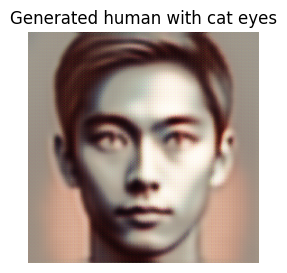

Epoch [2/100]: 100%|█████████▉| 299/300 [00:38<00:00,  7.88it/s, H_fake=0.354, H_real=0.619]

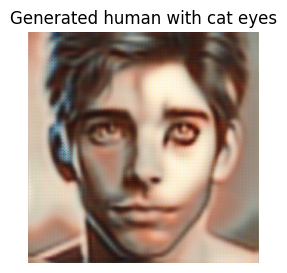

Epoch [3/100]: 100%|█████████▉| 299/300 [00:37<00:00,  7.97it/s, H_fake=0.319, H_real=0.659]

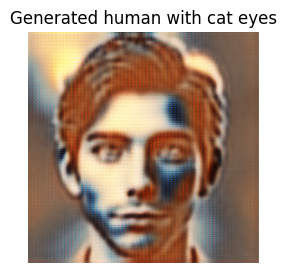

Epoch [4/100]: 100%|█████████▉| 299/300 [00:38<00:00,  7.85it/s, H_fake=0.327, H_real=0.654]

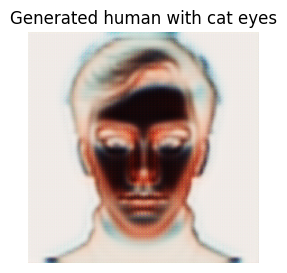

Epoch [5/100]: 100%|█████████▉| 299/300 [00:37<00:00,  7.93it/s, H_fake=0.31, H_real=0.661] 

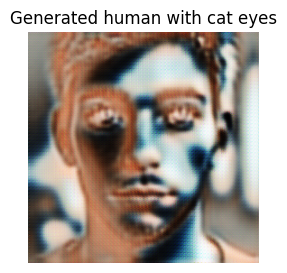

Epoch [6/100]: 100%|█████████▉| 299/300 [00:37<00:00,  7.87it/s, H_fake=0.31, H_real=0.674] 

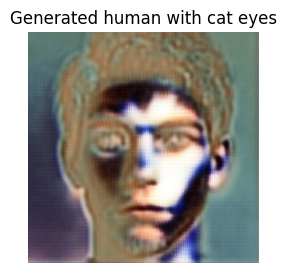

Epoch [7/100]: 100%|█████████▉| 299/300 [00:38<00:00,  7.92it/s, H_fake=0.304, H_real=0.68] 

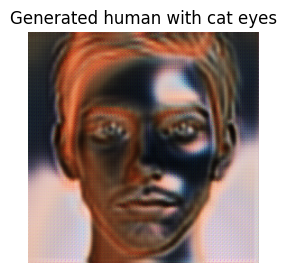

Epoch [8/100]: 100%|█████████▉| 299/300 [00:37<00:00,  7.95it/s, H_fake=0.287, H_real=0.693]

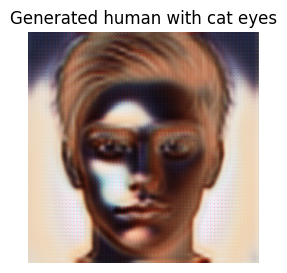

Epoch [9/100]: 100%|█████████▉| 299/300 [00:37<00:00,  7.92it/s, H_fake=0.293, H_real=0.677]

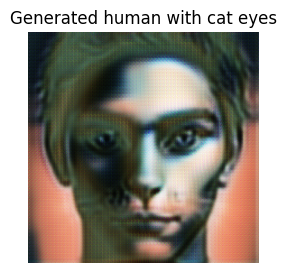

Epoch [10/100]: 100%|█████████▉| 299/300 [00:37<00:00,  7.91it/s, H_fake=0.297, H_real=0.676]

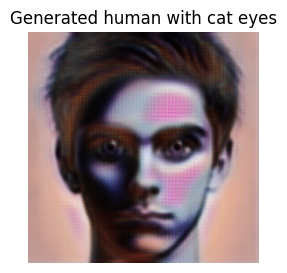

Epoch [11/100]: 100%|█████████▉| 299/300 [00:37<00:00,  7.92it/s, H_fake=0.297, H_real=0.686]

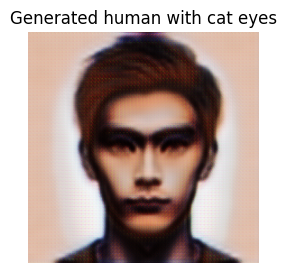

Epoch [12/100]: 100%|█████████▉| 299/300 [00:38<00:00,  7.86it/s, H_fake=0.302, H_real=0.674]

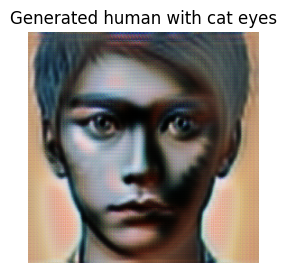

Epoch [13/100]: 100%|█████████▉| 299/300 [00:38<00:00,  7.90it/s, H_fake=0.313, H_real=0.662]

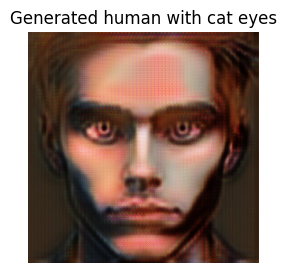

Epoch [14/100]: 100%|█████████▉| 299/300 [00:38<00:00,  7.88it/s, H_fake=0.289, H_real=0.693]

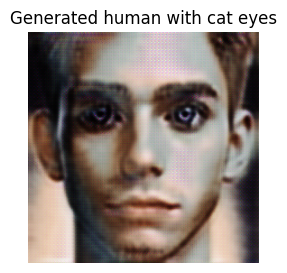

Epoch [15/100]: 100%|█████████▉| 299/300 [00:38<00:00,  7.86it/s, H_fake=0.3, H_real=0.685]  

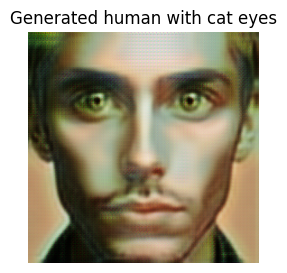

Epoch [16/100]: 100%|█████████▉| 299/300 [00:38<00:00,  7.93it/s, H_fake=0.298, H_real=0.682]

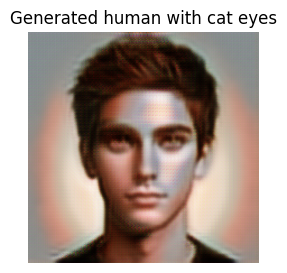

Epoch [17/100]: 100%|█████████▉| 299/300 [00:37<00:00,  7.89it/s, H_fake=0.298, H_real=0.691]

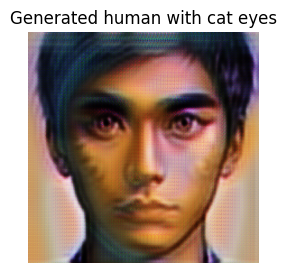

Epoch [18/100]: 100%|█████████▉| 299/300 [00:37<00:00,  7.87it/s, H_fake=0.294, H_real=0.688]

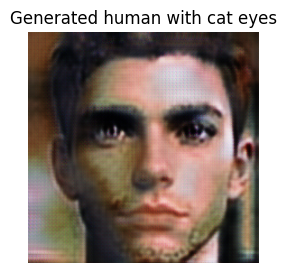

Epoch [19/100]: 100%|█████████▉| 299/300 [00:37<00:00,  7.95it/s, H_fake=0.294, H_real=0.69] 

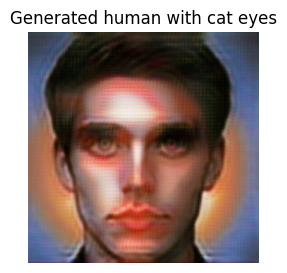

Epoch [20/100]: 100%|█████████▉| 299/300 [00:37<00:00,  7.88it/s, H_fake=0.297, H_real=0.689]

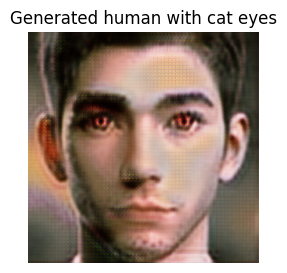

Epoch [21/100]: 100%|█████████▉| 299/300 [00:38<00:00,  7.85it/s, H_fake=0.291, H_real=0.686]

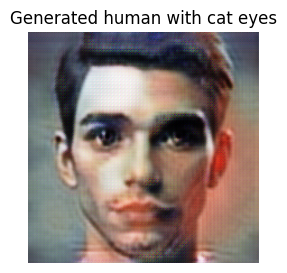

Epoch [22/100]: 100%|█████████▉| 299/300 [00:38<00:00,  7.86it/s, H_fake=0.295, H_real=0.69] 

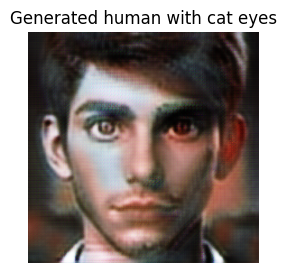

Epoch [23/100]: 100%|█████████▉| 299/300 [00:38<00:00,  7.94it/s, H_fake=0.296, H_real=0.691]

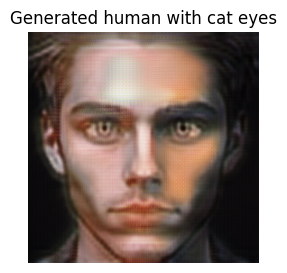

Epoch [24/100]: 100%|█████████▉| 299/300 [00:38<00:00,  7.83it/s, H_fake=0.289, H_real=0.689]

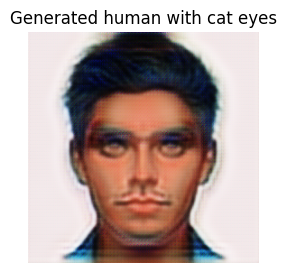

Epoch [25/100]: 100%|█████████▉| 299/300 [00:38<00:00,  7.91it/s, H_fake=0.291, H_real=0.704]

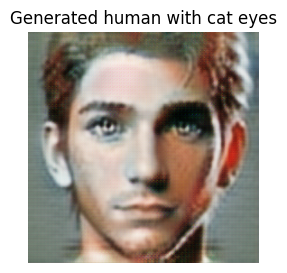

Epoch [26/100]: 100%|█████████▉| 299/300 [00:38<00:00,  7.89it/s, H_fake=0.289, H_real=0.692]

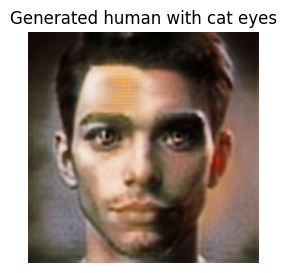

Epoch [27/100]: 100%|█████████▉| 299/300 [00:38<00:00,  7.85it/s, H_fake=0.281, H_real=0.705]

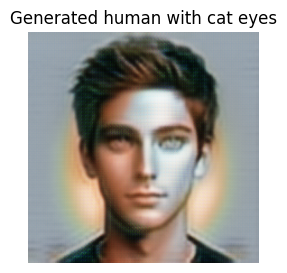

Epoch [28/100]: 100%|█████████▉| 299/300 [00:38<00:00,  7.85it/s, H_fake=0.273, H_real=0.716]

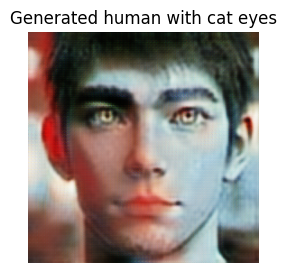

Epoch [29/100]: 100%|█████████▉| 299/300 [00:38<00:00,  7.97it/s, H_fake=0.287, H_real=0.707]

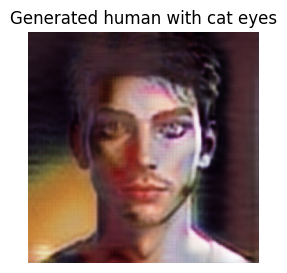

Epoch [30/100]: 100%|█████████▉| 299/300 [00:38<00:00,  7.83it/s, H_fake=0.29, H_real=0.687] 

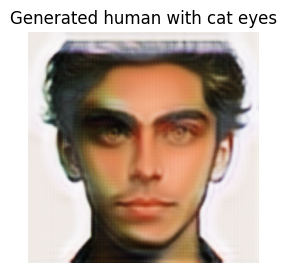

Epoch [31/100]: 100%|█████████▉| 299/300 [00:38<00:00,  7.86it/s, H_fake=0.275, H_real=0.72] 

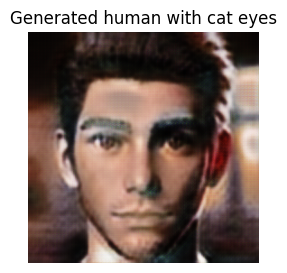

Epoch [32/100]: 100%|█████████▉| 299/300 [00:38<00:00,  7.88it/s, H_fake=0.218, H_real=0.777]

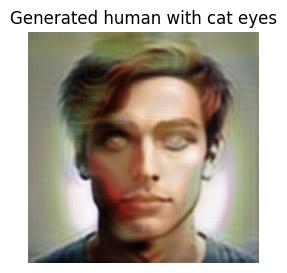

Epoch [33/100]: 100%|█████████▉| 299/300 [00:38<00:00,  7.89it/s, H_fake=0.262, H_real=0.73] 

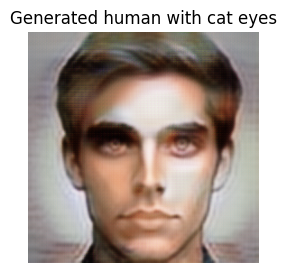

Epoch [34/100]: 100%|█████████▉| 299/300 [00:38<00:00,  7.84it/s, H_fake=0.267, H_real=0.72] 

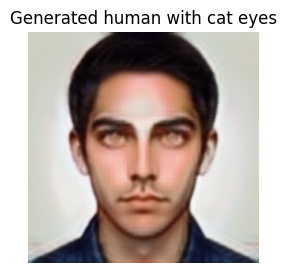

Epoch [35/100]: 100%|█████████▉| 299/300 [00:38<00:00,  7.91it/s, H_fake=0.253, H_real=0.734]

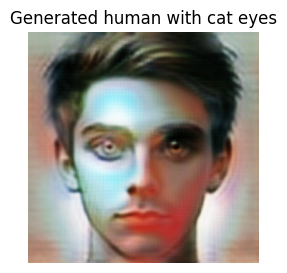

Epoch [36/100]: 100%|█████████▉| 299/300 [00:38<00:00,  7.84it/s, H_fake=0.237, H_real=0.757]

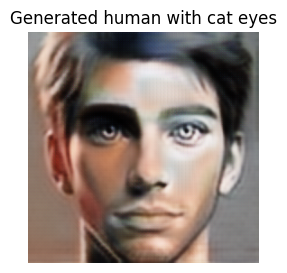

Epoch [37/100]: 100%|█████████▉| 299/300 [00:38<00:00,  7.90it/s, H_fake=0.256, H_real=0.734]

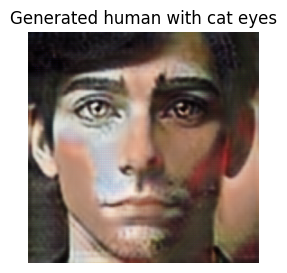

Epoch [38/100]: 100%|█████████▉| 299/300 [00:38<00:00,  7.85it/s, H_fake=0.289, H_real=0.704]

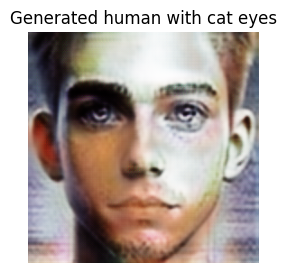

Epoch [39/100]: 100%|█████████▉| 299/300 [00:38<00:00,  7.87it/s, H_fake=0.282, H_real=0.713]

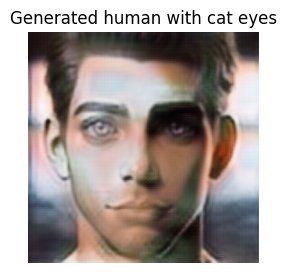

Epoch [40/100]: 100%|█████████▉| 299/300 [00:38<00:00,  7.91it/s, H_fake=0.27, H_real=0.719] 

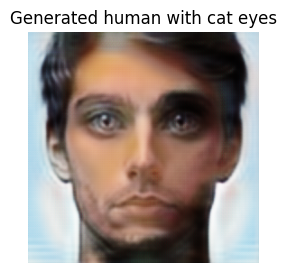

Epoch [41/100]: 100%|█████████▉| 299/300 [00:38<00:00,  7.87it/s, H_fake=0.228, H_real=0.77] 

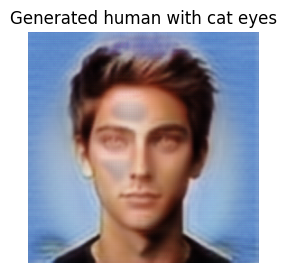

Epoch [42/100]: 100%|█████████▉| 299/300 [00:38<00:00,  7.86it/s, H_fake=0.266, H_real=0.73] 

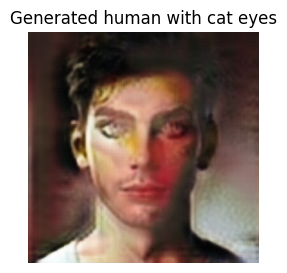

Epoch [43/100]: 100%|█████████▉| 299/300 [00:38<00:00,  7.91it/s, H_fake=0.25, H_real=0.739] 

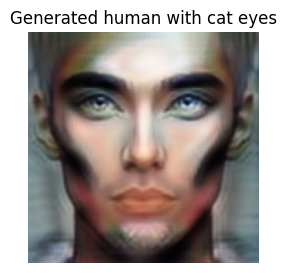

Epoch [44/100]: 100%|█████████▉| 299/300 [00:38<00:00,  7.97it/s, H_fake=0.242, H_real=0.752]

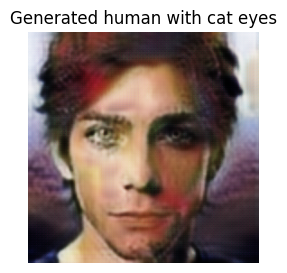

Epoch [45/100]: 100%|█████████▉| 299/300 [00:38<00:00,  7.84it/s, H_fake=0.282, H_real=0.713]

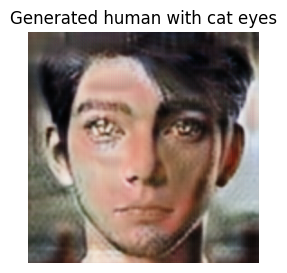

Epoch [46/100]: 100%|█████████▉| 299/300 [00:38<00:00,  7.88it/s, H_fake=0.272, H_real=0.724]

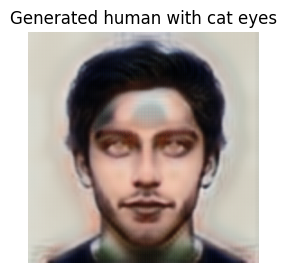

Epoch [47/100]: 100%|█████████▉| 299/300 [00:38<00:00,  7.90it/s, H_fake=0.275, H_real=0.712]

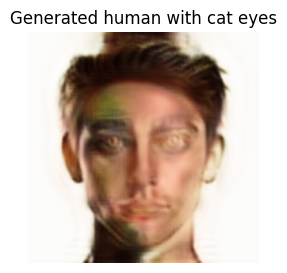

Epoch [48/100]: 100%|█████████▉| 299/300 [00:38<00:00,  7.89it/s, H_fake=0.263, H_real=0.731]

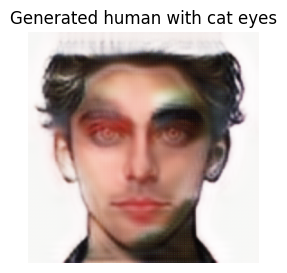

Epoch [49/100]: 100%|█████████▉| 299/300 [00:38<00:00,  7.85it/s, H_fake=0.252, H_real=0.747]

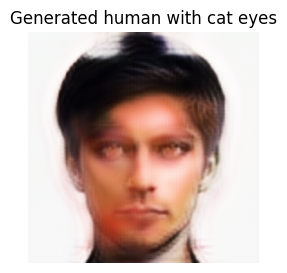

Epoch [50/100]: 100%|█████████▉| 299/300 [00:38<00:00,  7.86it/s, H_fake=0.122, H_real=0.882]

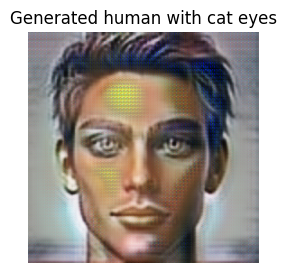

Epoch [51/100]: 100%|█████████▉| 299/300 [00:38<00:00,  7.91it/s, H_fake=0.0714, H_real=0.931]

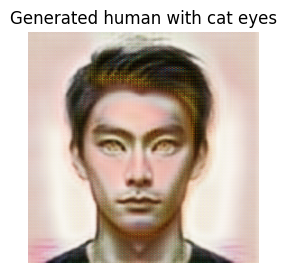

Epoch [52/100]: 100%|█████████▉| 299/300 [00:38<00:00,  7.85it/s, H_fake=0.0643, H_real=0.938]

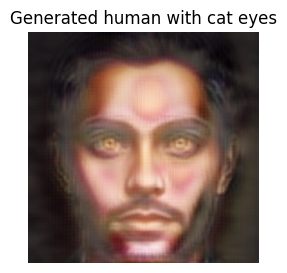

Epoch [53/100]: 100%|█████████▉| 299/300 [00:38<00:00,  7.86it/s, H_fake=0.189, H_real=0.809]

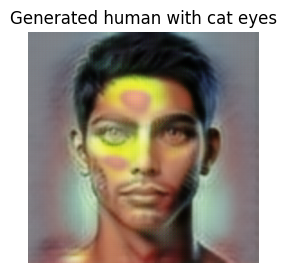

Epoch [54/100]: 100%|█████████▉| 299/300 [00:38<00:00,  7.89it/s, H_fake=0.205, H_real=0.79] 

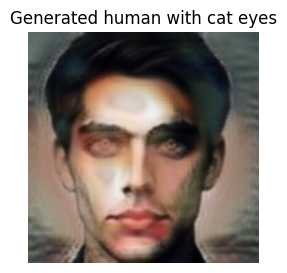

Epoch [55/100]: 100%|█████████▉| 299/300 [00:38<00:00,  7.84it/s, H_fake=0.271, H_real=0.729]

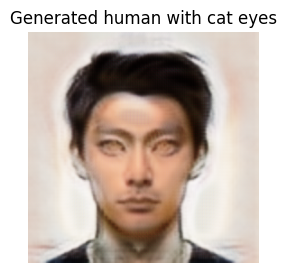

Epoch [56/100]: 100%|█████████▉| 299/300 [00:38<00:00,  7.97it/s, H_fake=0.225, H_real=0.773]

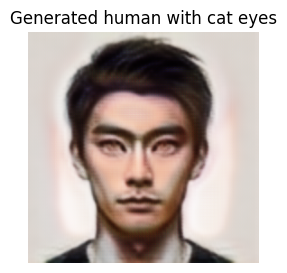

Epoch [57/100]: 100%|█████████▉| 299/300 [00:37<00:00,  7.94it/s, H_fake=0.201, H_real=0.796]

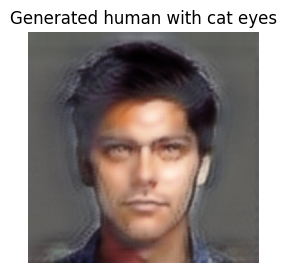

Epoch [58/100]: 100%|█████████▉| 299/300 [00:37<00:00,  7.94it/s, H_fake=0.237, H_real=0.757]

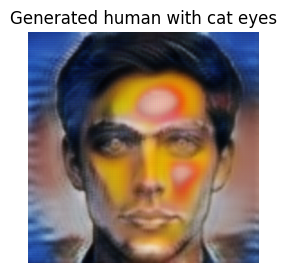

Epoch [59/100]: 100%|█████████▉| 299/300 [00:37<00:00,  7.88it/s, H_fake=0.248, H_real=0.752]

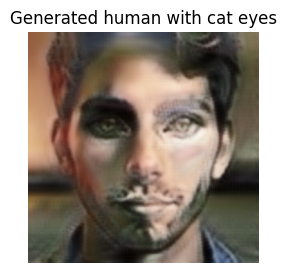

Epoch [60/100]: 100%|█████████▉| 299/300 [00:37<00:00,  7.97it/s, H_fake=0.248, H_real=0.743]

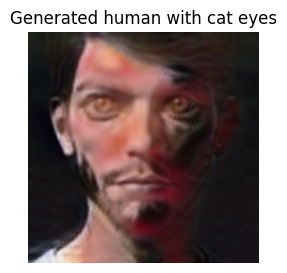

Epoch [61/100]: 100%|█████████▉| 299/300 [00:37<00:00,  7.86it/s, H_fake=0.237, H_real=0.753]

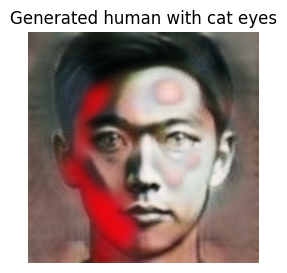

Epoch [62/100]: 100%|█████████▉| 299/300 [00:37<00:00,  7.88it/s, H_fake=0.217, H_real=0.77] 

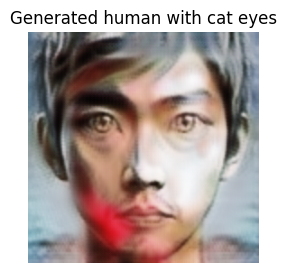

Epoch [63/100]: 100%|█████████▉| 299/300 [00:38<00:00,  7.87it/s, H_fake=0.257, H_real=0.737]

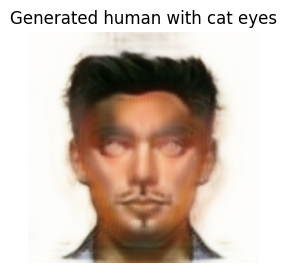

Epoch [64/100]: 100%|█████████▉| 299/300 [00:38<00:00,  7.95it/s, H_fake=0.24, H_real=0.754] 

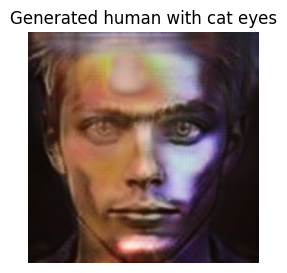

Epoch [65/100]: 100%|█████████▉| 299/300 [00:38<00:00,  7.98it/s, H_fake=0.238, H_real=0.759]

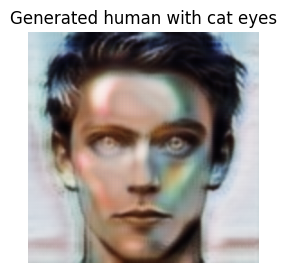

Epoch [66/100]: 100%|█████████▉| 299/300 [00:38<00:00,  7.90it/s, H_fake=0.192, H_real=0.811]

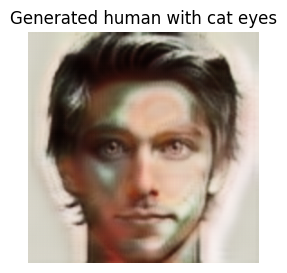

Epoch [67/100]: 100%|█████████▉| 299/300 [00:38<00:00,  7.87it/s, H_fake=0.218, H_real=0.782]

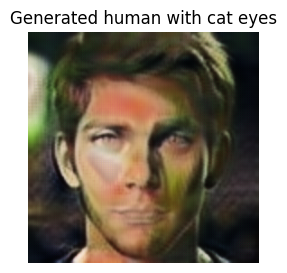

Epoch [68/100]: 100%|█████████▉| 299/300 [00:38<00:00,  7.87it/s, H_fake=0.222, H_real=0.77] 

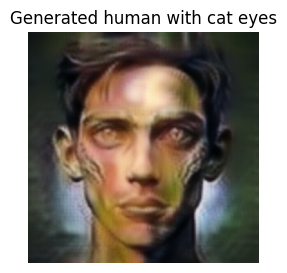

Epoch [69/100]: 100%|█████████▉| 299/300 [00:38<00:00,  7.81it/s, H_fake=0.237, H_real=0.758]

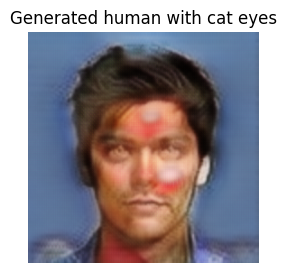

Epoch [70/100]: 100%|█████████▉| 299/300 [00:38<00:00,  7.82it/s, H_fake=0.244, H_real=0.748]

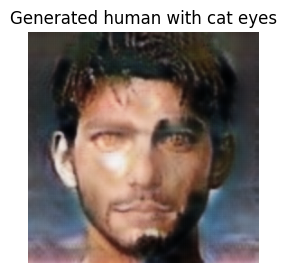

Epoch [71/100]: 100%|█████████▉| 299/300 [00:38<00:00,  7.91it/s, H_fake=0.144, H_real=0.857]

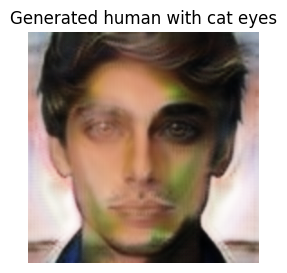

Epoch [72/100]: 100%|█████████▉| 299/300 [00:38<00:00,  7.87it/s, H_fake=0.236, H_real=0.768]

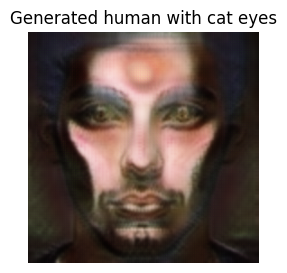

Epoch [73/100]: 100%|█████████▉| 299/300 [00:38<00:00,  7.87it/s, H_fake=0.24, H_real=0.755] 

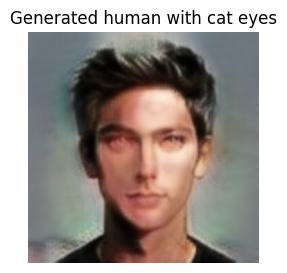

Epoch [74/100]: 100%|█████████▉| 299/300 [00:37<00:00,  7.87it/s, H_fake=0.235, H_real=0.749]

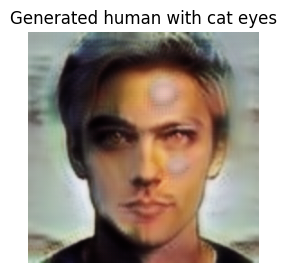

Epoch [75/100]: 100%|█████████▉| 299/300 [00:38<00:00,  7.89it/s, H_fake=0.24, H_real=0.761] 

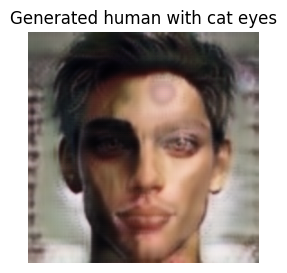

Epoch [76/100]: 100%|█████████▉| 299/300 [00:37<00:00,  8.00it/s, H_fake=0.237, H_real=0.76] 

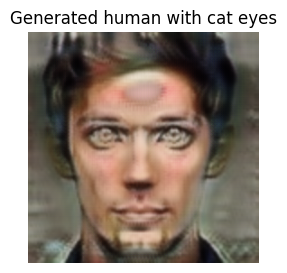

Epoch [77/100]: 100%|█████████▉| 299/300 [00:37<00:00,  7.89it/s, H_fake=0.228, H_real=0.77] 

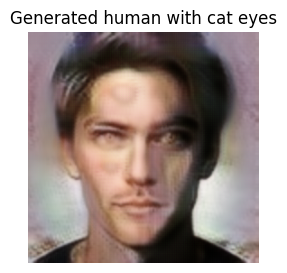

Epoch [78/100]: 100%|█████████▉| 299/300 [00:37<00:00,  7.93it/s, H_fake=0.234, H_real=0.76] 

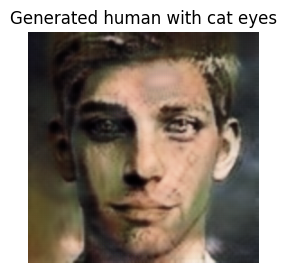

Epoch [79/100]: 100%|█████████▉| 299/300 [00:37<00:00,  7.96it/s, H_fake=0.227, H_real=0.769]

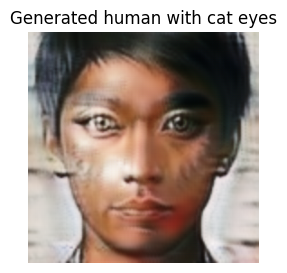

Epoch [80/100]: 100%|█████████▉| 299/300 [00:37<00:00,  7.93it/s, H_fake=0.213, H_real=0.787]

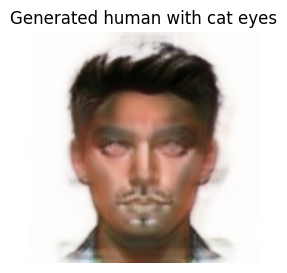

Epoch [81/100]: 100%|█████████▉| 299/300 [00:38<00:00,  7.88it/s, H_fake=0.24, H_real=0.746] 

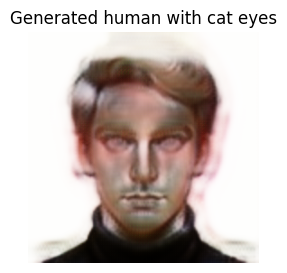

Epoch [82/100]: 100%|█████████▉| 299/300 [00:38<00:00,  7.86it/s, H_fake=0.22, H_real=0.771] 

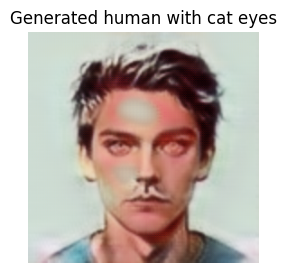

Epoch [83/100]: 100%|█████████▉| 299/300 [00:38<00:00,  7.86it/s, H_fake=0.232, H_real=0.768]

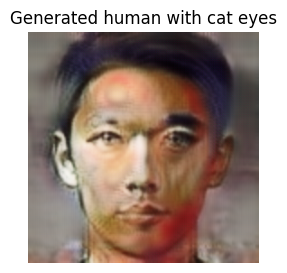

Epoch [84/100]: 100%|█████████▉| 299/300 [00:38<00:00,  7.84it/s, H_fake=0.198, H_real=0.802]

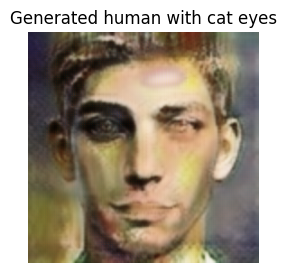

Epoch [85/100]: 100%|█████████▉| 299/300 [00:38<00:00,  7.93it/s, H_fake=0.21, H_real=0.788] 

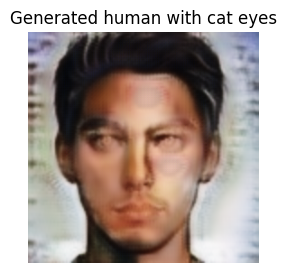

Epoch [86/100]: 100%|█████████▉| 299/300 [00:38<00:00,  7.88it/s, H_fake=0.223, H_real=0.764]

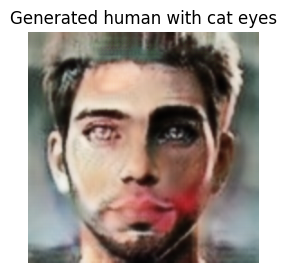

Epoch [87/100]: 100%|█████████▉| 299/300 [00:38<00:00,  7.86it/s, H_fake=0.215, H_real=0.782]

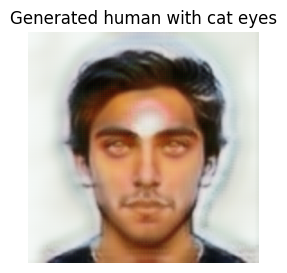

Epoch [88/100]: 100%|█████████▉| 299/300 [00:37<00:00,  7.90it/s, H_fake=0.204, H_real=0.792]

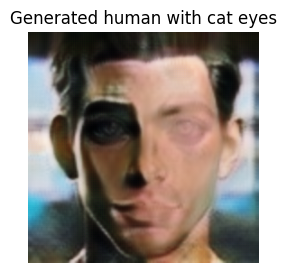

Epoch [89/100]: 100%|█████████▉| 299/300 [00:38<00:00,  7.91it/s, H_fake=0.225, H_real=0.774]

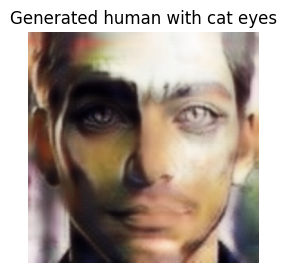

Epoch [90/100]: 100%|█████████▉| 299/300 [00:38<00:00,  7.94it/s, H_fake=0.142, H_real=0.862]

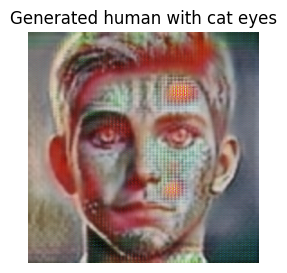

Epoch [91/100]: 100%|█████████▉| 299/300 [00:37<00:00,  8.01it/s, H_fake=0.0614, H_real=0.938]

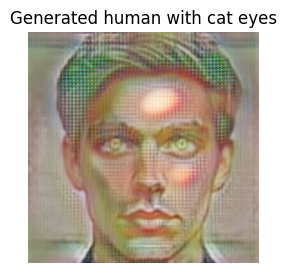

Epoch [92/100]: 100%|█████████▉| 299/300 [00:37<00:00,  8.00it/s, H_fake=0.0467, H_real=0.956]

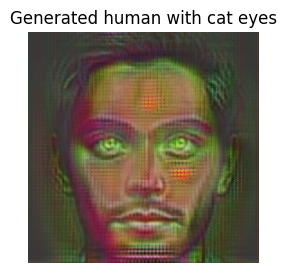

Epoch [93/100]: 100%|█████████▉| 299/300 [00:37<00:00,  7.89it/s, H_fake=0.062, H_real=0.937] 

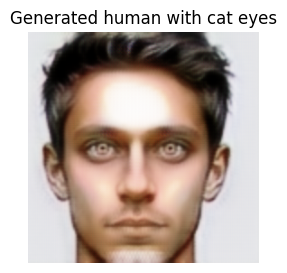

Epoch [94/100]: 100%|█████████▉| 299/300 [00:38<00:00,  7.87it/s, H_fake=0.185, H_real=0.809]

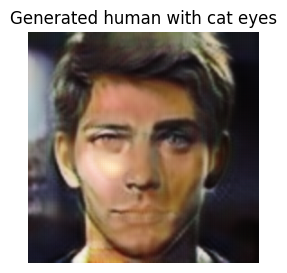

Epoch [95/100]: 100%|█████████▉| 299/300 [00:38<00:00,  7.89it/s, H_fake=0.176, H_real=0.828]

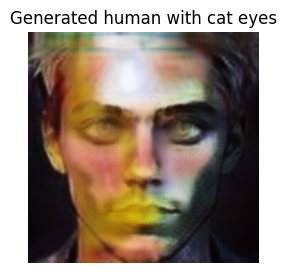

Epoch [96/100]: 100%|█████████▉| 299/300 [00:37<00:00,  7.88it/s, H_fake=0.204, H_real=0.793]

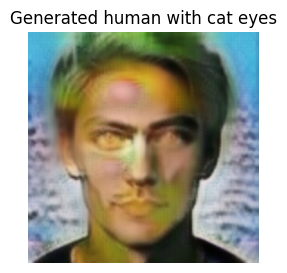

Epoch [97/100]: 100%|█████████▉| 299/300 [00:37<00:00,  7.92it/s, H_fake=0.139, H_real=0.866]

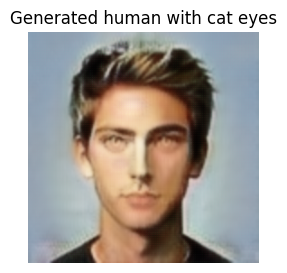

Epoch [98/100]: 100%|█████████▉| 299/300 [00:38<00:00,  7.86it/s, H_fake=0.185, H_real=0.809]

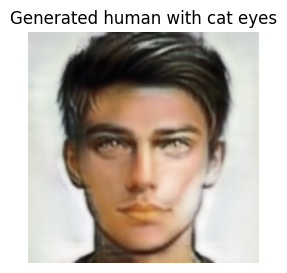

Epoch [99/100]: 100%|█████████▉| 299/300 [00:37<00:00,  7.90it/s, H_fake=0.185, H_real=0.812]

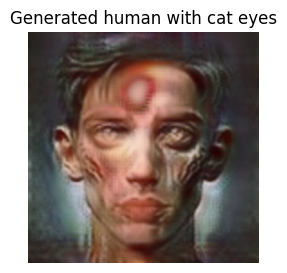

Epoch [100/100]: 100%|█████████▉| 299/300 [00:38<00:00,  7.85it/s, H_fake=0.186, H_real=0.813]

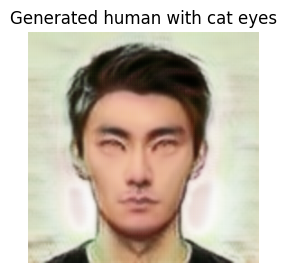

Epoch [100/100]: 100%|██████████| 300/300 [00:38<00:00,  7.80it/s, H_fake=0.186, H_real=0.813]


=> Saving checkpoint


In [20]:
import torch
import sys
from torch.utils.data import DataLoader
import torch.nn as nn
import torch.optim as optim
from tqdm import tqdm
import matplotlib.pyplot as plt


def train_fn(
    disc_H, gen_C, loader, opt_disc, opt_gen, l1, mse, d_scaler, g_scaler, epoch
):
    H_reals = 0
    H_fakes = 0
    loop = tqdm(loader, leave=True, desc=f"Epoch [{epoch + 1}/{NUM_EPOCHS}]")

    for idx, (cat, human) in enumerate(loop):
        cat = cat.to(DEVICE)
        human = human.to(DEVICE)

        # Train Discriminator H
        with torch.amp.autocast('cuda'):
            fake_cat = gen_C(human)
            D_H_real = disc_H(cat)
            D_H_fake = disc_H(fake_cat.detach())
            H_reals += D_H_real.mean().item()
            H_fakes += D_H_fake.mean().item()
            D_H_real_loss = mse(D_H_real, torch.ones_like(D_H_real))
            D_H_fake_loss = mse(D_H_fake, torch.zeros_like(D_H_fake))
            D_H_loss = D_H_real_loss + D_H_fake_loss

            # Total discriminator loss
            D_loss = D_H_loss

        opt_disc.zero_grad()
        d_scaler.scale(D_loss).backward()
        d_scaler.step(opt_disc)
        d_scaler.update()

        # Train Generator C
        with torch.amp.autocast('cuda'):
            D_H_fake = disc_H(fake_cat)
            loss_G_C = mse(D_H_fake, torch.ones_like(D_H_fake))

            # Cycle loss
            cycle_human = gen_C(fake_cat)
            cycle_human_loss = l1(human, cycle_human)

            # Identity loss
            identity_human = gen_C(human)
            identity_human_loss = l1(human, identity_human)

            # Total generator loss
            G_loss = (
                loss_G_C
                + cycle_human_loss * LAMBDA_CYCLE
                + identity_human_loss * LAMBDA_IDENTITY
            )

        opt_gen.zero_grad()
        g_scaler.scale(G_loss).backward()
        g_scaler.step(opt_gen)
        g_scaler.update()

        # Display generated image at the end of each epoch
        if idx == len(loader) - 1:
            with torch.no_grad():
                # Convert to float32, NumPy, and rescale
                fake_cat = fake_cat[0].permute(1, 2, 0).to(torch.float32).cpu().numpy()
                fake_cat = (fake_cat + 1) / 2  # Rescale to [0, 1]

                # Display image
                plt.figure(figsize=(3, 3))
                plt.imshow(fake_cat)
                plt.title("Generated human with cat eyes")
                plt.axis("off")
                plt.show()


        loop.set_postfix(H_real=H_reals / (idx + 1), H_fake=H_fakes / (idx + 1))


def main():
    disc_H = Discriminator(in_channels=3).to(DEVICE)
    gen_C = Generator(img_channels=3, num_residuals=9).to(DEVICE)

    opt_disc = optim.Adam(
        list(disc_H.parameters()),
        lr=LEARNING_RATE,
        betas=(0.5, 0.999),
    )

    opt_gen = optim.Adam(
        list(gen_C.parameters()),
        lr=LEARNING_RATE,
        betas=(0.5, 0.999),
    )

    L1 = nn.L1Loss()
    mse = nn.MSELoss()

    if LOAD_MODEL:
        load_checkpoint(
            CHECKPOINT_GEN_C,
            gen_C,
            opt_gen,
            LEARNING_RATE,
        )
        load_checkpoint(
            CHECKPOINT_CRITIC_H,
            disc_H,
            opt_disc,
            LEARNING_RATE,
        )

    dataset = HumanCatEyesDataset(
        root_cat=TRAIN_DIR + "/cats", 
        root_human=TRAIN_DIR + "/humans",  
        transform=transforms,
    )

    loader = DataLoader(
        dataset,
        batch_size=BATCH_SIZE,
        shuffle=True,
        num_workers=NUM_WORKERS,
        pin_memory=True,
    )
    g_scaler = torch.amp.GradScaler(device="cuda")
    d_scaler = torch.amp.GradScaler(device="cuda")

    for epoch in range(NUM_EPOCHS):
        train_fn(
            disc_H,
            gen_C,
            loader,
            opt_disc,
            opt_gen,
            L1,
            mse,
            d_scaler,
            g_scaler,
            epoch,
        )

        # Save checkpoint only for the last epoch
        if SAVE_MODEL and epoch == NUM_EPOCHS - 1:
            save_checkpoint(gen_C, opt_gen, filename=CHECKPOINT_GEN_C)

if __name__ == "__main__":
    main()


Issues mainly come from the little dataset of positive examples (only 136 positive examples) and the fact that they are not actual people with cat eyes, but generated people with cat eyes through DALL·E.

I did a bit of fine tuning while changing a few hyperparameters to see which settings would provide the best image, nevertheless the lack of time and computational capacity limited me.

In [21]:
# load the generator and the saved weights
gen_C_loaded = Generator(img_channels=3, num_residuals=9).to(DEVICE)
checkpoint = torch.load(CHECKPOINT_GEN_C, map_location=DEVICE, weights_only=True)
gen_C_loaded.load_state_dict(checkpoint["state_dict"])
gen_C_loaded.eval()

Generator(
  (initial): Sequential(
    (0): Conv2d(3, 64, kernel_size=(7, 7), stride=(1, 1), padding=(3, 3), padding_mode=reflect)
    (1): InstanceNorm2d(64, eps=1e-05, momentum=0.1, affine=False, track_running_stats=False)
    (2): ReLU(inplace=True)
  )
  (down_blocks): ModuleList(
    (0): ConvBlock(
      (conv): Sequential(
        (0): Conv2d(64, 128, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), padding_mode=reflect)
        (1): InstanceNorm2d(128, eps=1e-05, momentum=0.1, affine=False, track_running_stats=False)
        (2): ReLU(inplace=True)
      )
    )
    (1): ConvBlock(
      (conv): Sequential(
        (0): Conv2d(128, 256, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), padding_mode=reflect)
        (1): InstanceNorm2d(256, eps=1e-05, momentum=0.1, affine=False, track_running_stats=False)
        (2): ReLU(inplace=True)
      )
    )
  )
  (res_blocks): Sequential(
    (0): ResidualBlock(
      (block): Sequential(
        (0): ConvBlock(
          (conv): S

In [22]:
from PIL import Image
import numpy as np
import torch
import albumentations as A
from albumentations.pytorch import ToTensorV2

# transformations for preprocessing
transform = A.Compose([
    A.Resize(width=256, height=256),
    A.Normalize(mean=[0.5, 0.5, 0.5], std=[0.5, 0.5, 0.5], max_pixel_value=255),
    ToTensorV2(),
])

def preprocess_image(image_path):
    try:
        image = Image.open(image_path)
        if image.mode != "RGB":
            image = image.convert("RGB")
        
        image = np.array(image)

        augmented = transform(image=image)
        tensor_image = augmented["image"].unsqueeze(0)
        
        return tensor_image.to(DEVICE)
    
    except Exception as e:
        print(f"error during the processing of the image: {e}")
        return None


In [23]:
# load the image
input_image = preprocess_image("/kaggle/input/celeba-dataset/img_align_celeba/img_align_celeba/000012.jpg")

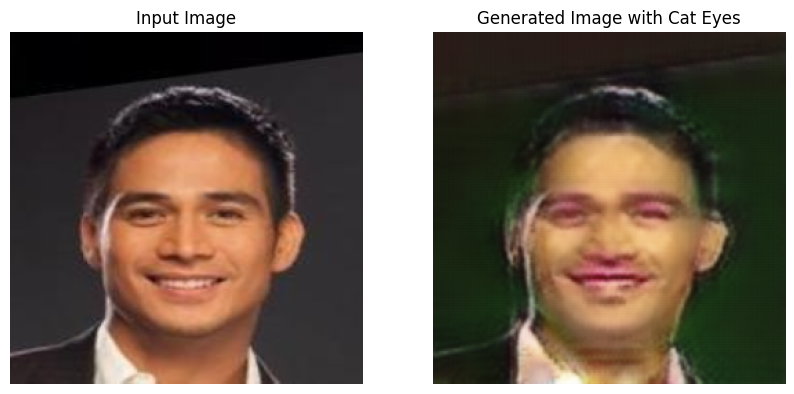

In [24]:
import matplotlib.pyplot as plt
import numpy as np

# generate the new image
with torch.no_grad():
    gen_C_loaded.eval()
    generated_image = gen_C_loaded(input_image)

# rescale the input image for displaying
input_image_display = input_image.squeeze(0).permute(1, 2, 0).cpu().numpy()
input_image_display = (input_image_display + 1) / 2 

# rescale the generated image for displaying
generated_image_display = generated_image.squeeze(0).permute(1, 2, 0).cpu().numpy()  # (C, H, W) -> (H, W, C)
generated_image_display = (generated_image_display + 1) / 2  # Rescale de [-1, 1] à [0, 1]

# plot the images
plt.figure(figsize=(10, 5))

plt.subplot(1, 2, 1)
plt.imshow(input_image_display)
plt.axis("off")
plt.title("Input Image")

plt.subplot(1, 2, 2)
plt.imshow(generated_image_display)
plt.axis("off")
plt.title("Generated Image with Cat Eyes")

plt.show()

